# Housing Analysis

The objective of this analysis is to have a clearer picture of the available data extracted by the scrapper, once cleaned and processed (with geographical info added, and with extreme outliers removed). A basic EDA is performed for the columns of interest, as well as some heatmaps, as now the latitude and longitude oh each house is available (at least, approximate). New data from an external source is also loaded (in this case, the loudness of the city of Barcelona, as mesured and made available from the city council) and plotted to see its distribution. 

The loudness data is available from:
https://opendata-ajuntament.barcelona.cat/data/es/dataset/isofones-mapa-estrategic-soroll/resource/e112f54f-51bd-4f7a-a1f6-6272595f2bd8

In [1]:
import sys
sys.path.append("..")

import pandas as pd
import geopandas as gpd
import plotly.express as px
from plotly.subplots import make_subplots
from ETL.common import execute_query

In [2]:
q = "SELECT * FROM houses_clean ORDER BY timestamp DESC"
df_raw = execute_query(q)

In [3]:
df = df_raw.copy()

The loudness file (a geojson with the geometry and data) is loaded with geopandas, joined with the dataset (as we have for each house its location, we can determine if it pertains to a certain geometry in the geodataframe), and some preprocessing is done on the full dataframe (the categorical columns are made of type "category", and the missing values are replaced with a new category "Null").

In [4]:
loudness_df = gpd.read_file("2017_isofones_total_lden_mapa_estrategic_soroll_bcn.gpkg",
                     layer="2017_Isofones_Total_Lden_Mapa_Estrategic_Soroll_BCN")
loudness_df = loudness_df.to_crs(epsg=4326)
loudness_df = loudness_df.rename(columns={"Rang": "loudness"})

In [5]:
df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326")
df = df.sjoin(loudness_df, how="left")
df = df[df.columns.difference(["fid", "index_right"])]

In [6]:
cat_cols = ["active", "city", "type", "orientation", "age", "parking", "floor", 
            "elevator", "furniture", "state", "heating", "water_heating", 
            "formatted_address", "pets", "loudness"]
num_cols = ["price", "rooms", "bathrooms", "surface", "energy", "emissions", "latitude", "longitude"]

plot_cols = cat_cols + num_cols

for c in cat_cols:
    df[c] = df[c].fillna("Null")
    if c == "age":
        df[c] = pd.Categorical(df[c], ["Null", "Menos de 1 año", "1 a 5 años", "5 a 10 años", "10 a 20 años", 
                                       "20 a 30 años", "30 a 50 años", "50 a 70 años", "70 a 100 años", "+ 100 años"])
    elif c == "floor":
        df[c] = pd.Categorical(df[c], ["Null", "Sótano", "Otro", "Bajos", "Entresuelo", "1ª planta", "2ª planta",
                                       "3ª planta", "4ª planta", "5ª planta", "6ª planta", "7ª planta", 
                                       "8ª planta", "9ª planta", "10ª planta",  "11ª planta", "12ª planta",
                                       "13ª planta", "14ª planta", "A partir de la 15ª planta"])
    elif c == "orientation":
        df[c] = pd.Categorical(df[c], ["Null", "Este", "Noreste", "Norte", "Noroeste", "Oeste", "Suroeste", "Sur", "Sureste"])
    else:
        df[c] = pd.Categorical(df[c])

group_cols = [e for e in cat_cols if e not in ("active", "formatted_address")]

For all the columns of interest, an histogram is plotted.

In [7]:
for c in plot_cols:    
    if c not in ("formatted_address", "active"):
        fig = px.histogram(df[c].sort_values())
        fig.show()

The plots are similar to the ones seen in the initial Scrapper analysis, but now the missing entries are shown as a "Null" category. Most insights can be seen at that analysis, and here only new ones are discussed:

    - All entries after cleaning have the "type" field informed.
    - As the loudness data is only for the city of Barcelona, all other houses are going to have that value as null.
    - The price distribution has some peaks around the thousands and five-hundreds, specially notable after the 2.500€ mark. Seems that the prices, in general, are rounded around these values.
    - Surface is very centered around 60-70 m2.
    - Latitude and longitude histograms don't give much information, as they are paired values, checking them individually does not make much sense. 

A geographical map is plotted for the latitude and longitude. 4 heatmaps are plotted: a density heatmap to see the overall spatial distribution; a price heatmap; and energy and emissions heatmaps.

In [8]:
clean_lats = df.latitude.dropna().values
clean_lons = df.longitude.dropna().values

df_geo = pd.DataFrame({"Latitude": clean_lats, "Longitude": clean_lons})
df_geo_price = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "price": df[df["latitude"].notna()].price.values})
df_geo_emissions = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "emissions": df[df["latitude"].notna()].emissions.values})
df_geo_energy = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "energy": df[df["latitude"].notna()].energy.values})

In [9]:
df.loc[df["latitude"] == df_geo["Latitude"].max(), :]

,active,age,bathrooms,city,elevator,emissions,energy,floor,formatted_address,full_street_city,...,orientation,parking,pets,price,rooms,state,surface,timestamp,type,water_heating
8349,True,10 a 20 años,2.0,Sallent,true,31.0,146.0,2ª planta,"Ctra. Sallent, 22640 Sallent de Gállego, Huesc...","Calle Carretera, Sallent, Sallent, Spain",...,Sur,Privado,Null,850.0,3.0,Muy bien,99.0,10:07:11.614956+00:00,Piso,Gas Natural


In [10]:
fig_count = px.density_map(df_geo, lat='Latitude', lon='Longitude', 
                        radius=15)
fig_price = px.density_map(df_geo_price, lat='Latitude', lon='Longitude', z="price",
                        radius=15)
fig_emissions = px.density_map(df_geo_emissions, lat='Latitude', lon='Longitude', z="emissions",
                        radius=15)
fig_energy = px.density_map(df_geo_energy, lat='Latitude', lon='Longitude', z="energy",
                        radius=15)

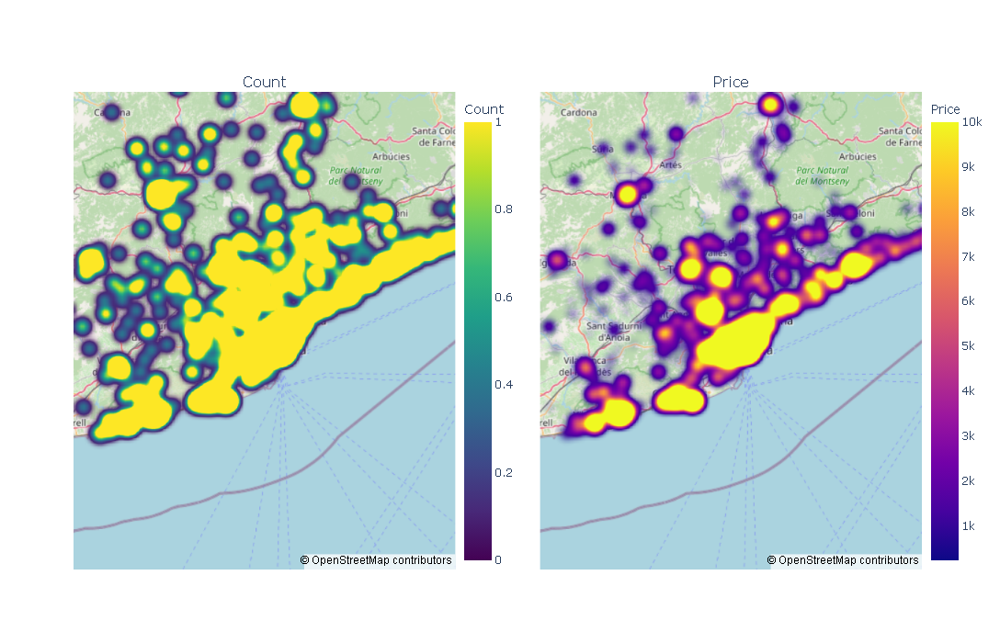

In [11]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Count", "Price"))

for trace_c in fig_count.data:
    trace_c['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace_c, row=1, col=1)

for trace_p in fig_price.data:
    trace_p['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace_p, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Viridis', colorbar=dict(title="Count", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Price", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

It can be seen that there are some "hotspots" with many houses. Some of them are not real, as some addresses in the original ad were not complete, or only approximations, so the estimated latitude and longitude may be the same for some houses (if, for example, only the street and city was specified, all ads in that street are mapped to the same latlon). Also, it can be seen that some houses are out of the study area (the province of Barcelona). This is because some address was not correctly geolocated by the gmaps API (for example, one house was in "Calle Carretera, Sallent, Spain" as per the original ad, and was geolocated as "Ctra. Sallent, 22640 Sallent de Gállego, Huesca". The names are very similar, but the confusion probably arises as both poblations have a similar name, and the fact that the original street name is "Carretera" does not help). For later analyses, this problem should be adressed, either by removing the data or correcting it.

As for the prices, the most expensive ones are at Barcelona city, but some hot spots are seen in other cities, such as Sant Cugat or some coastal cities.

In [12]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Emissions", "Energy"))

for trace in fig_emissions.data:
    trace['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace, row=1, col=1)

for trace in fig_energy.data:
    trace['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Viridis', colorbar=dict(title="Emissions", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Energy", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

The energy and emissions are similar, as they follow similar distributions and patterns. Most concentrations are in urban areas.

C:\Users\jcf\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning:

Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.



<Axes: >

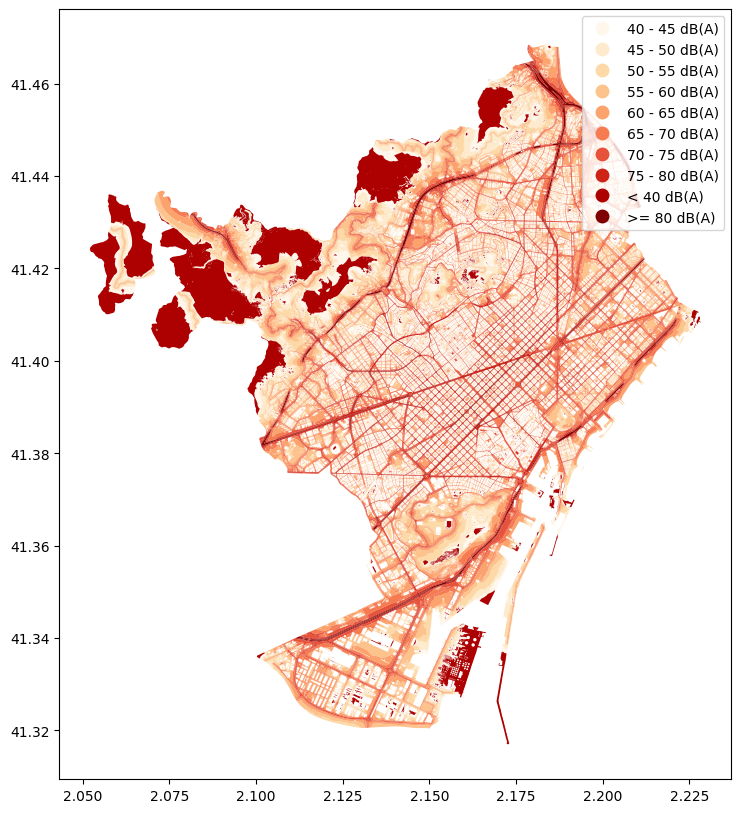

In [13]:
loudness_df.plot(column="loudness", legend=True, figsize=(20, 10), cmap='OrRd')

The loudness data is very detailed, as it contains over 100k polygons, each one with a loudness value. Most loud areas are the mountains and port (expected, as they are not protected of the wind), and the big streets.